# Detecting COVID-19 with Chest X Ray using PyTorch


The dataset used for implementing this project was extracted from [COVID-19 Radiography Dataset](https://www.kaggle.com/tawsifurrahman/covid19-radiography-database) on Kaggle.

## Downloading Data

Try to uncomment the following lines for downloading the dataset directly from Kaggle, note that you must use your own .js file provided in your Kaggle account.

In [1]:
# ! pip install -q kaggle
# ! chmod 600 kaggle.json
# ! kaggle datasets list
# ! kaggle datasets download -d tawsifurrahman/covid19-radiography-database

Once you have downloaded the zip file containing the dataset you must unzip it.

In [2]:
# ! unzip covid19-radiography-database.zip

## Importing Libraries

In [3]:
%matplotlib inline

import os
import shutil
import random
import torch
import torchvision
import numpy as np

from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(0)

print('Using PyTorch version', torch.__version__)

Using PyTorch version 1.8.1+cu102


## Preparing Training and Test Sets

In this cell we are preparing the dataset to get ready for work.

In [4]:
class_names = ['normal', 'viral_pneumonia', 'covid', 'lung_opacity']
root_dir = 'COVID-19_Radiography_Dataset'
source_dirs = ['Normal', 'Viral Pneumonia', 'COVID', 'Lung_Opacity']

if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    for c in class_names:
        images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('png')]
        selected_images = random.sample(images, 30)
        for image in selected_images:
            source_path = os.path.join(root_dir, c, image)
            target_path = os.path.join(root_dir, 'test', c, image)
            shutil.move(source_path, target_path)

Note that some directories must been generated on your working directory.

## Creating Custom Dataset

In this cell we are creating a custom data set to develop this implementation. In this part some preprocessing steps have been performed, the most important are the choice of the random image, image normalization, standardization to RGB and contrast enhancement.

In [5]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x[-3:].lower().endswith('png')]
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names =  ['normal', 'viral_pneumonia', 'covid', 'lung_opacity']
        
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)
            
        self.image_dirs = image_dirs
        self.transform = transform
        
    
    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])
    
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        img = Image.open(image_path).convert('RGB')
        # Converting from PIL image to numpy array
        data = np.asarray(img)
        # Performing a Contrast Stretching in each image from the Dataset
        hist,bins = np.histogram(data.flatten(),256,[0,256])
        cdf = hist.cumsum()
        cdf_normalized = cdf * hist.max()/ cdf.max()
        cdf_m = np.ma.masked_equal(cdf,0)
        cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
        cdf = np.ma.filled(cdf_m,0).astype('uint8')
        # Converting back to PIL image
        image = Image.fromarray(cdf[img])
        
        return self.transform(image), self.class_names.index(class_name)

# Image Transformations

Some other pre-processing steps were done separately in the following code cell to take advantage of the torchvision library module, we can mention the necessary image resize, and image normalization, and it is worth mentioning that a short data augmentation step was performed by means of a Horizontal flip.

In [6]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Prepare DataLoader

In the following cells we are preparing the dataloaders corresponding to the training and test datasets.

In [7]:
train_dirs = {
    'normal': 'COVID-19_Radiography_Dataset/normal',
    'viral_pneumonia': 'COVID-19_Radiography_Dataset/viral_pneumonia',
    'covid': 'COVID-19_Radiography_Dataset/covid',
    'lung_opacity': 'COVID-19_Radiography_Dataset/lung_opacity'
}

train_dataset = ChestXRayDataset(train_dirs, train_transform)

Found 10162 normal examples
Found 1315 viral_pneumonia examples
Found 3586 covid examples
Found 5982 lung_opacity examples


In [8]:
test_dirs = {
    'normal': 'COVID-19_Radiography_Dataset/test/normal',
    'viral_pneumonia': 'COVID-19_Radiography_Dataset/test/viral_pneumonia',
    'covid': 'COVID-19_Radiography_Dataset/test/covid',
    'lung_opacity': 'COVID-19_Radiography_Dataset/test/lung_opacity'
}

test_dataset = ChestXRayDataset(test_dirs, test_transform)

Found 30 normal examples
Found 30 viral_pneumonia examples
Found 30 covid examples
Found 30 lung_opacity examples


Note that we are definyning a batch size of 6 images.

In [9]:
batch_size = 6

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 3508
Number of test batches 20


## Data distribution

In this part we aim to show how the four classes present in our training data set are being distributed.

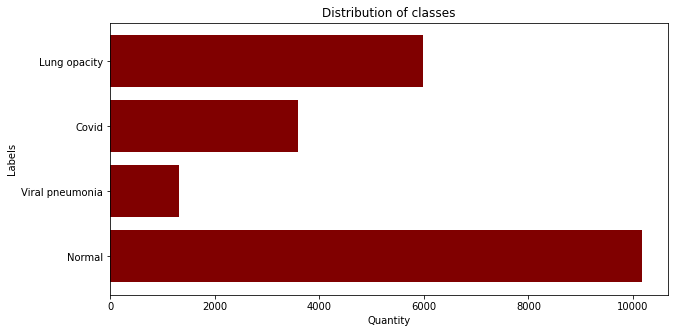

In [10]:
class_names =  ['normal', 'viral_pneumonia', 'covid', 'lung_opacity']
dist = {}
quant = {}
        
for class_name in class_names:
    quant[class_name] = [x for x in os.listdir(train_dirs[class_name]) if x[-3:].lower().endswith('png')]
    dist[class_name.replace('_', ' ').capitalize()] = len(quant[class_name])

courses = list(dist.keys())
values = list(dist.values())
  
fig = plt.figure(figsize=(10, 5))
plt.barh(courses, values, color='maroon')

plt.title("Distribution of classes")
plt.xlabel("Quantity")
plt.ylabel("Labels")
plt.show()

Only the labels of the training set were considered.

## Data Visualization

In the following cells some functions are defined to show random images corresponding to the training set, or test as indicated in the code.

In [11]:
class_names = train_dataset.class_names


def show_images(images, labels, preds):
    plt.figure(figsize=(20,10))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

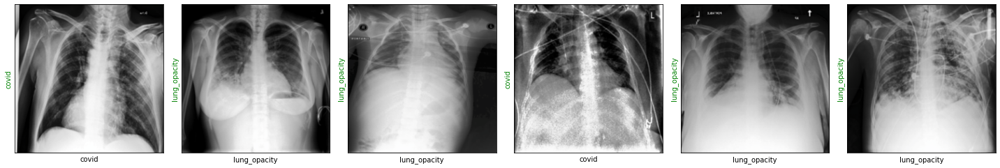

In [12]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

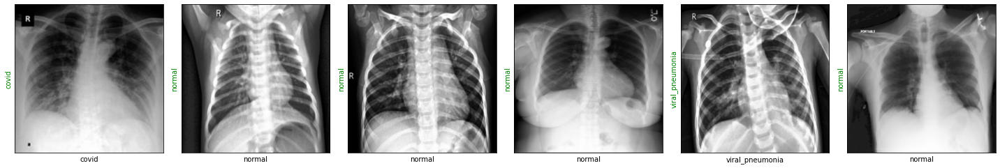

In [13]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

## Creating the Model

To create the model, the ResNet18 module already included and pre-trained in the Pytorch dependencies is used.

In [14]:
resnet18 = torchvision.models.resnet18(pretrained=True)

print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

As in the case of our implementation we will only work with the classification in four classes, we must modify the last layer of the ResNet18 network to be able to work properly with it.

In [15]:
resnet18.cuda()

resnet18.fc = torch.nn.Linear(in_features=512, out_features=4)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet18.parameters(), lr=3e-5)

Below we will show some predictions made only with the pre-trained model.

In [16]:
def show_preds():
    resnet18.cuda().eval()
    images, labels = next(iter(dl_test))
    outputs = resnet18(images.cuda())
    _, preds = torch.max(outputs, 1)
    show_images(images.cpu(), labels.cpu(), preds.cpu())

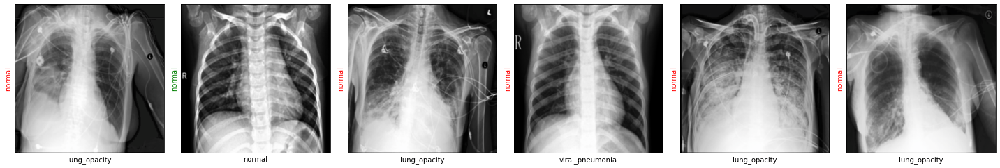

In [17]:
show_preds()

As you can see there are several false predictions, therefore, it is necessary to retrain the model with our training images.

## Training the Model

In the next line of code, the model will be trained with a single epoch, although as it is a fairly powerful model such as ResNet18, it is very likely that a sufficiently high accuracy will be achieved much earlier, so a conditional that if 95% accuracy will be achieved then the training will be stopped.

In [18]:
def train(epochs):
    print('Starting training..')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.

        resnet18.train() # set model to training phase

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = resnet18(images.cuda())
            loss = loss_fn(outputs, labels.cuda())
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                resnet18.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(dl_test):
                    outputs = resnet18(images.cuda())
                    loss = loss_fn(outputs, labels.cuda())
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    accuracy += sum((preds == labels.cuda()).cpu().numpy())

                val_loss /= (val_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_preds()

                resnet18.train()

                if accuracy >= 0.95:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Starting training..
Starting epoch 1/1
Evaluating at step 0
Validation Loss: 1.9020, Accuracy: 0.2167


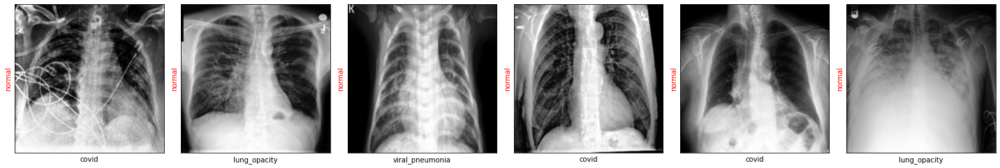

Evaluating at step 20
Validation Loss: 1.1818, Accuracy: 0.4500


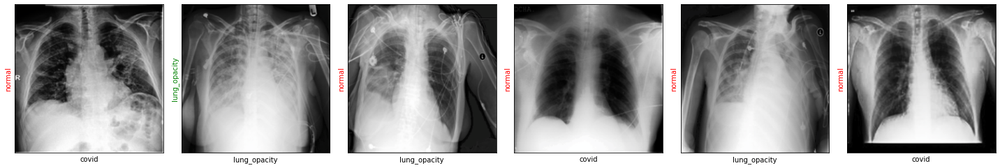

Evaluating at step 40
Validation Loss: 0.9626, Accuracy: 0.6083


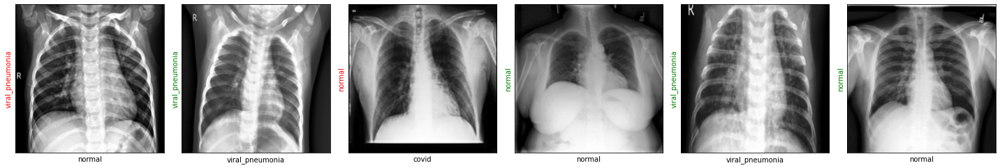

Evaluating at step 60
Validation Loss: 0.6403, Accuracy: 0.7917


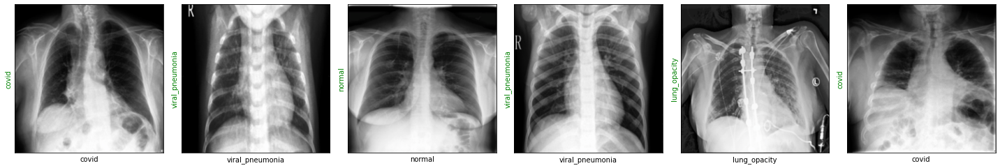

Evaluating at step 80
Validation Loss: 0.5417, Accuracy: 0.7667


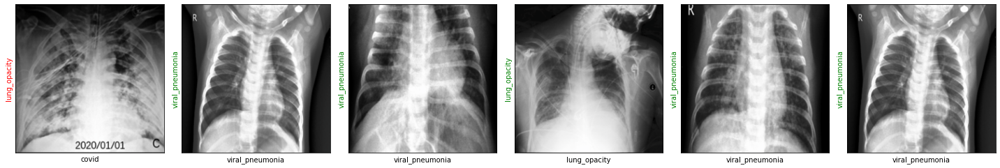

Evaluating at step 100
Validation Loss: 0.4965, Accuracy: 0.8000


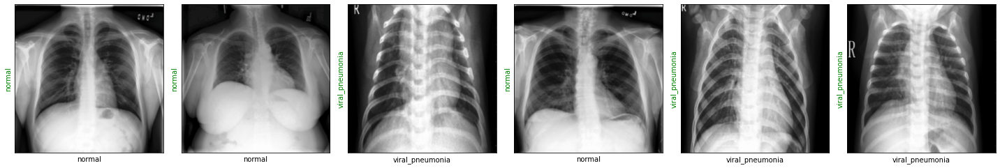

Evaluating at step 120
Validation Loss: 0.4775, Accuracy: 0.8083


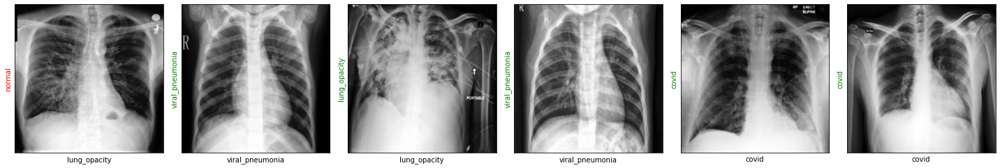

Evaluating at step 140
Validation Loss: 0.3771, Accuracy: 0.8500


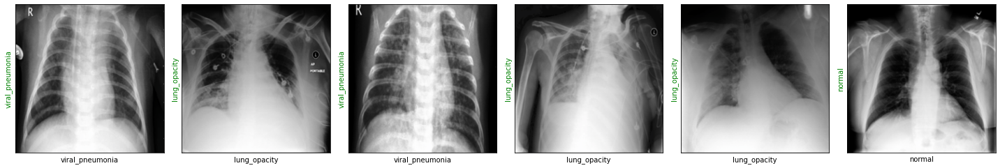

Evaluating at step 160
Validation Loss: 0.4693, Accuracy: 0.7917


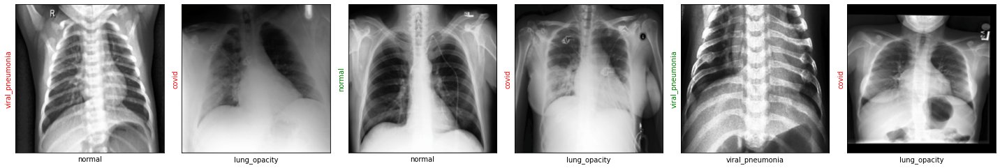

Evaluating at step 180
Validation Loss: 0.3677, Accuracy: 0.8500


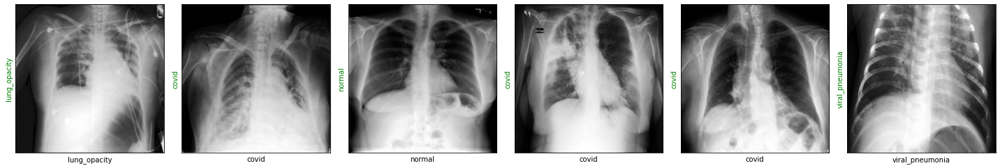

Evaluating at step 200
Validation Loss: 0.3997, Accuracy: 0.8417


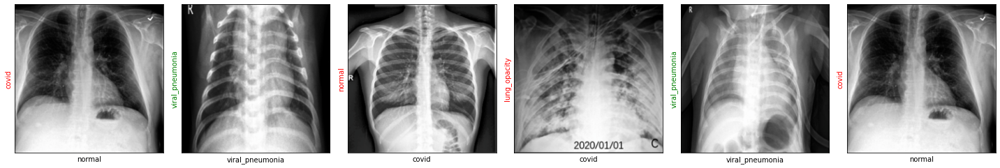

Evaluating at step 220
Validation Loss: 0.4088, Accuracy: 0.8083


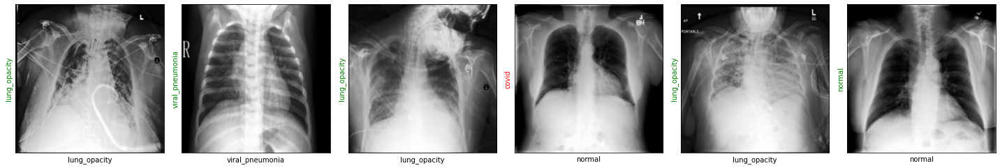

Evaluating at step 240
Validation Loss: 0.2667, Accuracy: 0.9167


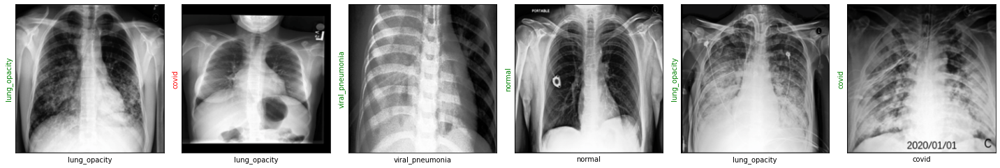

Evaluating at step 260
Validation Loss: 0.3101, Accuracy: 0.9417


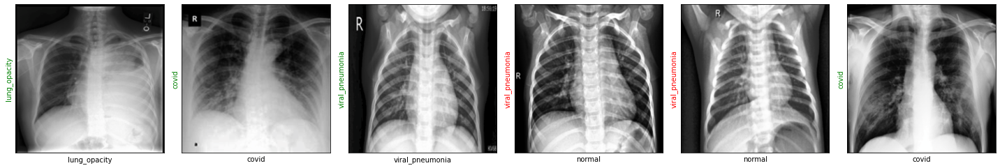

Evaluating at step 280
Validation Loss: 0.4848, Accuracy: 0.7917


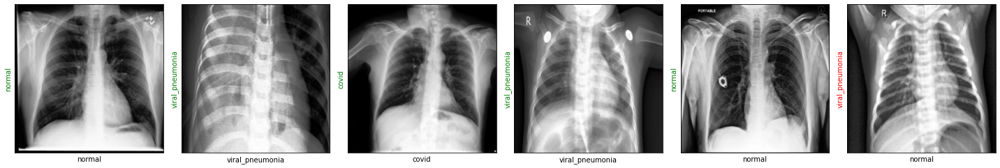

Evaluating at step 300
Validation Loss: 0.3284, Accuracy: 0.8917


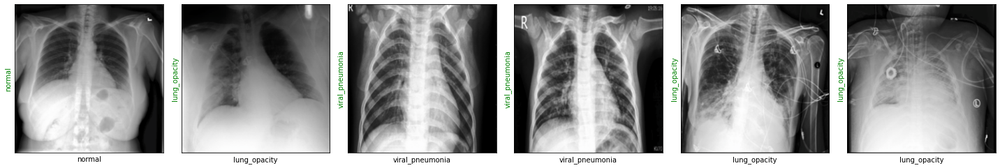

Evaluating at step 320
Validation Loss: 0.2391, Accuracy: 0.9083


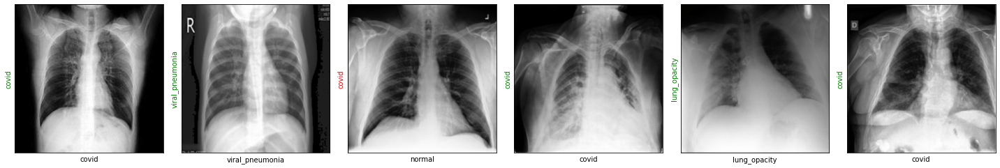

Evaluating at step 340
Validation Loss: 0.4633, Accuracy: 0.7833


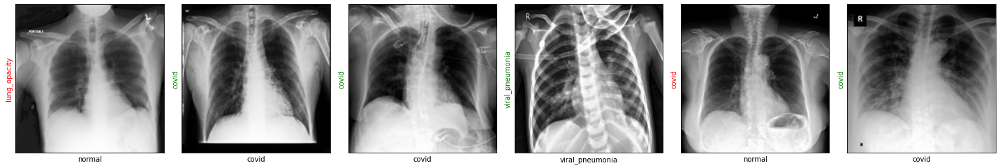

Evaluating at step 360
Validation Loss: 0.3334, Accuracy: 0.8667


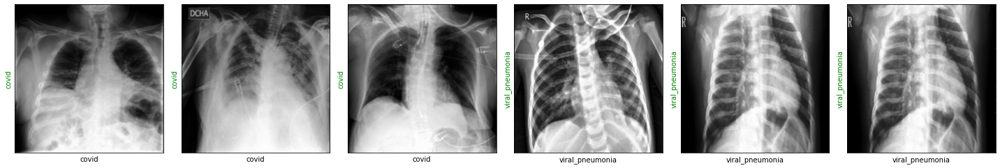

Evaluating at step 380
Validation Loss: 0.3437, Accuracy: 0.8750


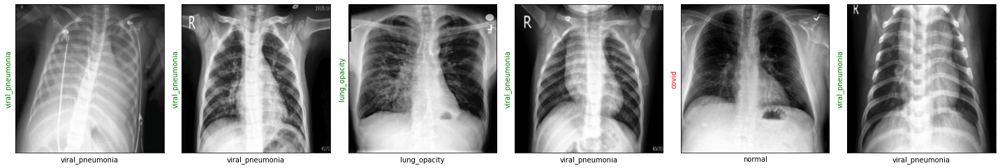

Evaluating at step 400
Validation Loss: 0.3314, Accuracy: 0.8500


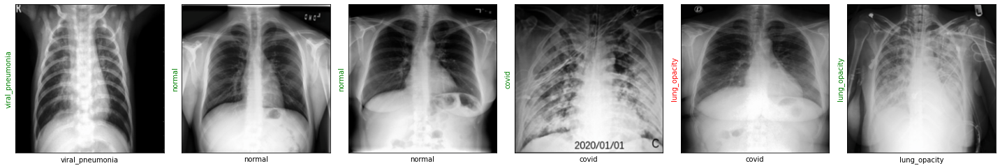

Evaluating at step 420
Validation Loss: 0.2888, Accuracy: 0.8833


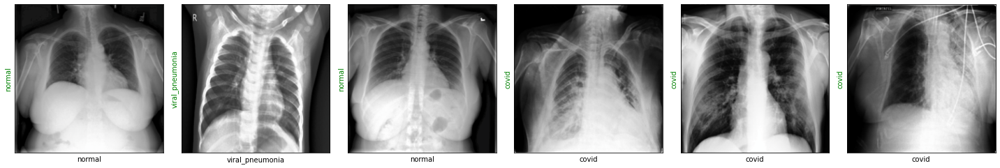

Evaluating at step 440
Validation Loss: 0.3113, Accuracy: 0.8667


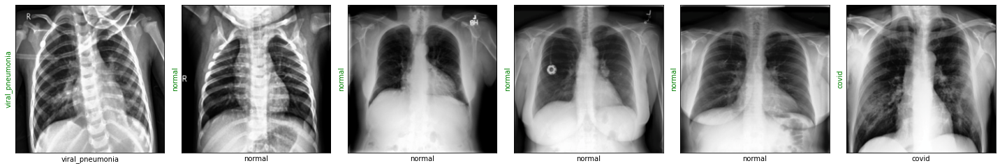

Evaluating at step 460
Validation Loss: 0.2831, Accuracy: 0.9000


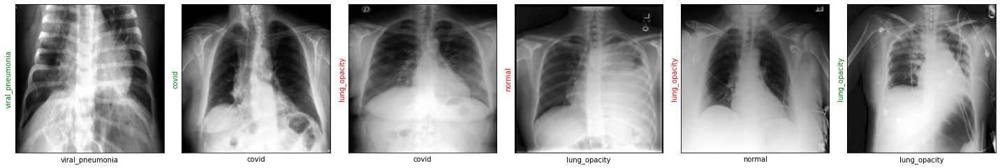

Evaluating at step 480
Validation Loss: 0.2724, Accuracy: 0.8833


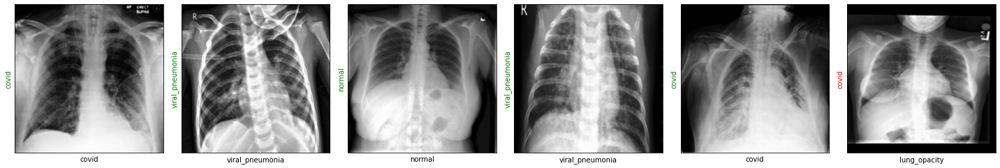

Evaluating at step 500
Validation Loss: 0.2710, Accuracy: 0.8583


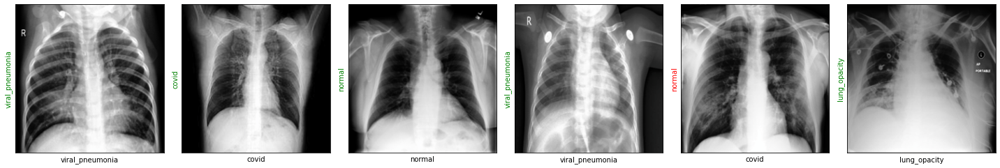

Evaluating at step 520
Validation Loss: 0.2408, Accuracy: 0.9167


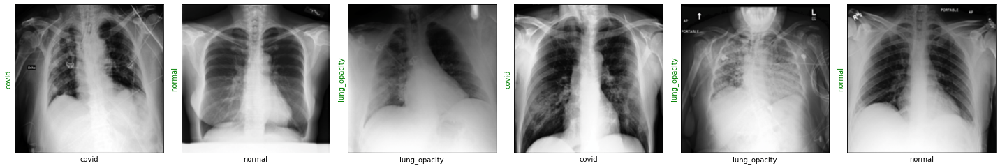

Evaluating at step 540
Validation Loss: 0.2889, Accuracy: 0.9250


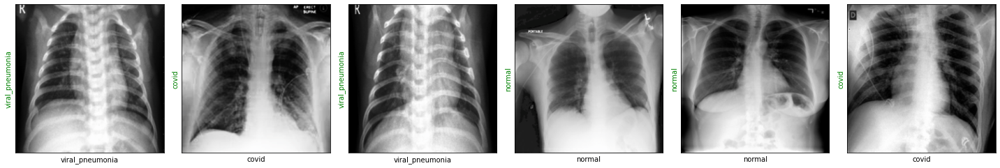

Evaluating at step 560
Validation Loss: 0.2867, Accuracy: 0.9083


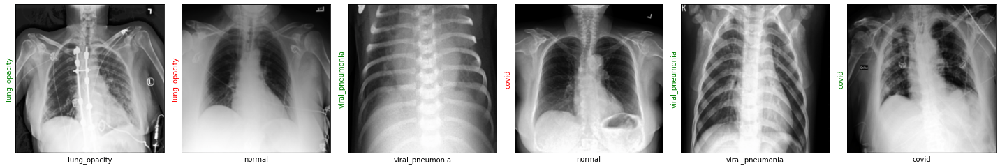

Evaluating at step 580
Validation Loss: 0.2572, Accuracy: 0.9250


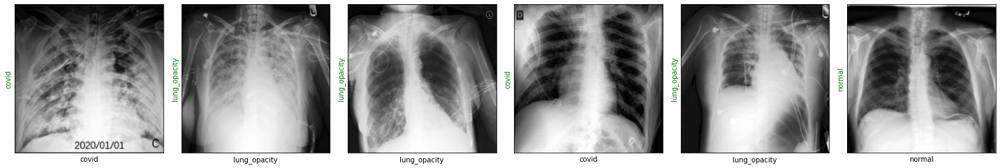

Evaluating at step 600
Validation Loss: 0.1814, Accuracy: 0.9500


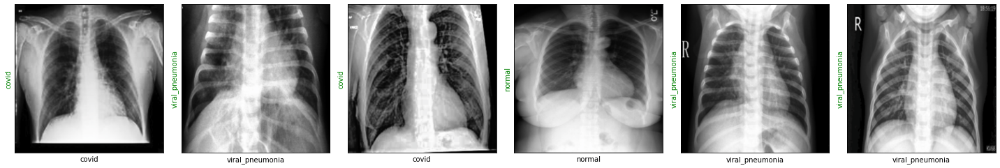

Performance condition satisfied, stopping..
CPU times: user 8min 17s, sys: 4.9 s, total: 8min 22s
Wall time: 2min 37s


In [19]:
%%time

train(epochs=1)

## Final Results

In the next cell, predictions are presented by taking random images from the test set.

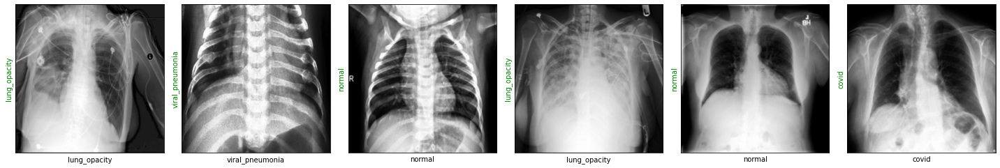

In [20]:
show_preds()

## Exporting the Model

In order to implement the model in a mobile application we must export it as a .pt file.

In [21]:
# Export model for gradient visualization
torch.save(resnet18.state_dict(),'covid_model.pth')

Note that we are exporting the latest model trained through the torch just in time compiler, thereby compiling it as a TorchScript, in order to be able to implement it both in a mobile environment and in other notebooks.

In [22]:
# Export model for evaluation metrics and mobile implementation
s = torch.jit.script(resnet18)
torch.jit.save(s,'covid_detection_app/assets/models/covid_model.pt')